In [1]:
import os
import io
# import some common libraries
import numpy as np
import cv2
import torch
import pandas as pd
# Show the image in ipynb
from IPython.display import clear_output, Image, display
import PIL.Image
import ast

In [2]:
dataset = pd.read_csv('all_tags2.csv', usecols=["misogynous", "1_y"], sep='\t')
dataset

,misogynous,1_y
0,0,"[{'class': 'Jug', 'conf': 0.9514831900596619, ..."
1,1,"[{'class': 'Stump', 'conf': 0.9555912613868713..."
2,0,"[{'class': 'Hair', 'conf': 0.7240530252456665,..."
3,0,"[{'class': 'Poster', 'conf': 0.930622816085815..."
4,0,"[{'class': 'Pumpkin', 'conf': 0.98442625999450..."
...,...,...
9995,0,"[{'class': 'Arm', 'conf': 0.9864069819450378, ..."
9996,0,"[{'class': 'Hair', 'conf': 0.9638645648956299,..."
9997,0,"[{'class': 'Dress', 'conf': 0.9925011992454529..."
9998,0,"[{'class': 'Knob', 'conf': 0.895808219909668, ..."


In [9]:
dataset = pd.read_csv('text_features_complete.csv', sep='\t')
dataset

,Unnamed: 0,file_name,misogynous,Text Transcription,clean,prof_count,vader,emotion,happy,sad,fear,angry,surprise
0,0,1.jpg,0,Milk Milk.zip,milk milk zip,0,0.0000,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.00,0.00,0.0,0.00,0.00
1,1,10.jpg,1,"ROSES ARE RED, VIOLETS ARE BLUE IF YOU DON'T S...",rose red violet blue you say yes I just rape you,1,-0.7881,"{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25...",0.00,0.50,0.0,0.25,0.25
2,2,1000.jpg,0,BREAKING NEWS: Russia releases photo of DONALD...,break news russia release photo donald trump h...,1,0.0000,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, ...",0.00,0.20,0.0,0.00,0.80
3,3,10000.jpg,0,MAN SEEKING WOMAN Ignad 18 O,man seek woman ignad o,0,0.0000,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.00,0.00,0.0,0.00,0.00
4,4,10006.jpg,0,Me explaining the deep lore of. J.R.R. Tolkein...,I explain deep lore j tolkein 's world arda pr...,0,0.0000,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.00,0.00,0.0,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9995,15002.jpg,0,WAITING FOR THE END OF THE COVID imgflip.com,wait end covid,0,0.0000,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, ...",0.00,0.00,0.0,0.00,1.00
9996,9996,15003.jpg,0,SMART WOMEN ARE AROUND imgflip.com,smart woman,0,0.4019,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.00,0.00,0.0,0.00,0.00
9997,9997,15004.jpg,0,GOOD GIRLS ARE BEHIND THE CORNER imgflip.com,good girl corner,0,0.4404,"{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33...",0.33,0.33,0.0,0.00,0.33
9998,9998,15005.jpg,0,COOKING FOR MY WIFE imgflip.com,cook my wife,0,0.0000,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':...",0.00,0.00,0.0,0.00,0.00


In [10]:
dataset["clean"] = dataset.clean.fillna("")

In [11]:
corpus = []
for item in list(dataset["clean"]):
    words = item.split()
    for token in words:
        corpus.append(token)

In [16]:
len(corpus)

113204

In [21]:
from collections import Counter
cnt_tot = Counter()

for item in corpus:
    cnt_tot[item] += 1

cnt_tot.most_common(1000)


[('I', 5804),
 ('you', 5595),
 ('my', 1960),
 ('woman', 1912),
 ('she', 1901),
 ('it', 1711),
 ('they', 1225),
 ('he', 1034),
 ('man', 940),
 ('like', 926),
 ('we', 852),
 ('girl', 790),
 ('make', 785),
 ("'s", 712),
 ('just', 597),
 ('say', 563),
 ('wife', 518),
 ('good', 494),
 ('girlfriend', 492),
 ('want', 457),
 ('feminist', 453),
 ('com', 449),
 ('look', 424),
 ('kitchen', 418),
 ('female', 391),
 ('know', 382),
 ('house', 382),
 ('think', 379),
 ('meme', 363),
 ('after', 346),
 ('tell', 336),
 ('time', 335),
 ('day', 330),
 ('people', 316),
 ('clean', 294),
 ('guy', 292),
 ('fuck', 290),
 ('year', 276),
 ('work', 273),
 ('cheat', 263),
 ('friend', 256),
 ('need', 256),
 ('hooker', 246),
 ('love', 246),
 ('new', 235),
 ('use', 232),
 ('come', 225),
 ('leave', 221),
 ('ask', 220),
 ('mom', 214),
 ('prostitute', 213),
 ('x', 212),
 ('game', 208),
 ('try', 206),
 ('feminism', 199),
 ('sex', 198),
 ('start', 197),
 ('let', 195),
 ('life', 194),
 ('male', 191),
 ('right', 191),
 ('hom

In [3]:
import ast
tags_mis = []
tags_not_mis = []
tags = []
for i in range(0, len(dataset)):
    elem = []
    if dataset["misogynous"][i] == 1:
        elem_mis = []
        for item in ast.literal_eval(dataset["1_y"][i]):
            if item["conf"] >= 0.5:
                elem_mis.append(item["class"])
                elem.append(item["class"])
        tags_mis.append(elem_mis)
        tags.append(elem)
    if dataset["misogynous"][i] == 0:
        elem_notmis=[]
        for item in ast.literal_eval(dataset["1_y"][i]):
            if item["conf"] >= 0.5:
                elem_notmis.append(item["class"])
                elem.append(item["class"])
            
        tags_not_mis.append(elem_notmis)
        tags.append(elem)

In [4]:
tot_tags = []
mis_tags = []
notmis_tags = []
for item in tags:
    tot_tags.append(list(set(item)))
for item in tags_mis:
    mis_tags.append(list(set(item)))
for item in tags_not_mis:
    notmis_tags.append(list(set(item)))

In [13]:
len(tot_tags)

10000

In [6]:
tot_tags[0]

['Shadow',
 'Word',
 'Letter',
 'Jug',
 'Handle',
 'Table',
 'Block',
 'Dessert',
 'Wall']

In [14]:
token_corpus = []
for doc in tot_tags:
    for token in doc:
        token_corpus.append(token)

In [14]:
token_corpus[:20]

['Shadow',
 'Word',
 'Letter',
 'Jug',
 'Handle',
 'Table',
 'Block',
 'Dessert',
 'Wall',
 'Bear',
 'Nose',
 'Animal',
 'Head',
 'Stump',
 'Face',
 'Word',
 'Ear',
 'Bottle',
 'Eye',
 'Grass']

In [16]:
len(token_corpus)

87191

In [15]:
import pandas as pd
import nltk
import string
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk import FreqDist
from nltk.tokenize import RegexpTokenizer
from nltk.tokenize import TreebankWordTokenizer
from nltk.tokenize import sent_tokenize
from string import punctuation

In [17]:
fdist = nltk.FreqDist(token_corpus)
words = []
freq = []
frequencies = []
for word, frequency in fdist.most_common(100):
    frequencies.append({"word": word, "freq": frequency})

In [21]:
freq.shape

AttributeError: 'list' object has no attribute 'shape'

In [20]:
 table = pd.DataFrame(frequencies)
 table

,word,freq
0,Hair,6270
1,Face,5678
2,Man,4445
3,Nose,4427
4,Eye,4292
...,...,...
95,Top,122
96,Plant,119
97,Chin,119
98,Bag,119


NameError: name 'BigramAssocMeasures' is not defined

In [18]:
words

AttributeError: 'list' object has no attribute 'shape'

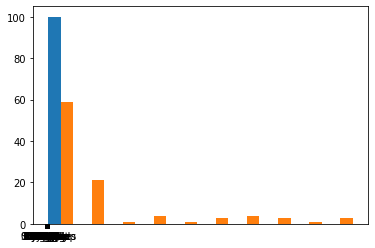

In [19]:
import matplotlib.pyplot as plt
import random

x = words
y = freq
plt.hist([x, y])
plt.show()


In [16]:
words[1]

'Head'

In [12]:
word[1]

'h'

In [5]:
from collections import Counter
cnt_tot = Counter()

for item in tot_tags:
    for tag in item:
        cnt_tot[tag] += 1

object_tags = cnt_tot.most_common(300)
print(object_tags)

[('Hair', 6270), ('Face', 5678), ('Man', 4445), ('Nose', 4427), ('Eye', 4292), ('Poster', 3784), ('Hand', 3745), ('Mouth', 3497), ('Shirt', 3483), ('Woman', 3180), ('Ear', 2776), ('Head', 2532), ('Arm', 1911), ('Wall', 1467), ('Leg', 1167), ('Glasses', 972), ('Person', 889), ('Hat', 770), ('Girl', 760), ('Tree', 734), ('Dress', 641), ('Tie', 616), ('Eyebrow', 604), ('Suit', 586), ('Beard', 577), ('Window', 532), ('Necklace', 506), ('Neck', 502), ('Table', 488), ('Pant', 476), ('Chair', 462), ('Jacket', 440), ('Car', 384), ('Short', 380), ('Letter', 374), ('Finger', 369), ('Jean', 363), ('Sky', 359), ('Building', 350), ('Collar', 344), ('Sign', 339), ('Floor', 337), ('Door', 329), ('Earring', 305), ('Boy', 299), ('Bottle', 283), ('Cat', 273), ('Grass', 254), ('Shoe', 253), ('Foot', 253), ('Dog', 252), ('Animal', 244), ('Pillow', 231), ('Watch', 223), ('Ring', 219), ('Flower', 215), ('Sunglasses', 212), ('Forehead', 205), ('Teeth', 201), ('Button', 196), ('Glass', 187), ('Belt', 187), ('

In [14]:
cnt_tot["Triangle"]

5

In [15]:
cnt_mis["Triangle"]

4

In [10]:
cnt_notmis["Bikini"]

4

In [23]:
cnt_tot["Underwear"]

7

151

In [7]:
from collections import Counter
cnt_mis = Counter()
for item in mis_tags:
    for tag in item:
        cnt_mis[tag] += 1
cnt_mis.most_common()

[('Hair', 3739),
 ('Face', 2942),
 ('Woman', 2319),
 ('Nose', 2293),
 ('Eye', 2166),
 ('Hand', 2163),
 ('Poster', 1980),
 ('Man', 1898),
 ('Shirt', 1895),
 ('Mouth', 1749),
 ('Ear', 1288),
 ('Head', 1196),
 ('Arm', 1174),
 ('Leg', 768),
 ('Wall', 766),
 ('Girl', 556),
 ('Glasses', 488),
 ('Dress', 477),
 ('Person', 417),
 ('Eyebrow', 392),
 ('Necklace', 371),
 ('Hat', 350),
 ('Tree', 349),
 ('Short', 299),
 ('Neck', 280),
 ('Window', 270),
 ('Jean', 251),
 ('Tie', 251),
 ('Earring', 247),
 ('Beard', 243),
 ('Pant', 242),
 ('Suit', 236),
 ('Chair', 233),
 ('Table', 232),
 ('Car', 219),
 ('Letter', 215),
 ('Finger', 205),
 ('Sky', 203),
 ('Floor', 186),
 ('Door', 178),
 ('Jacket', 168),
 ('Shoe', 167),
 ('Sign', 166),
 ('Bottle', 164),
 ('Foot', 160),
 ('Bikini', 151),
 ('Building', 147),
 ('Bracelet', 139),
 ('Sunglasses', 136),
 ('Collar', 136),
 ('Skirt', 135),
 ('Watch', 132),
 ('Ring', 130),
 ('Teeth', 128),
 ('Lip', 126),
 ('Strap', 123),
 ('Pillow', 121),
 ('Grass', 115),
 ('Top',

In [18]:
len(cnt_mis)

958

In [25]:
tags_mis = []
for item in object_tags:
    tags_mis.append((item[0], cnt_mis[item[0]]))

In [20]:
len(tags_mis)

300

In [51]:
tags_mis

[('Face', 4013),
 ('Head', 3714),
 ('Hair', 4091),
 ('Eye', 3233),
 ('Mouth', 3114),
 ('Nose', 3120),
 ('Poster', 2917),
 ('Man', 2337),
 ('Shirt', 2907),
 ('Hand', 2944),
 ('Arm', 2696),
 ('Woman', 3179),
 ('Ear', 2126),
 ('Person', 2041),
 ('Wall', 1897),
 ('Letter', 1721),
 ('Word', 1354),
 ('Girl', 1729),
 ('Leg', 1380),
 ('Neck', 888),
 ('Jacket', 664),
 ('Glasses', 723),
 ('Tree', 640),
 ('Eyebrow', 788),
 ('Window', 627),
 ('Hat', 548),
 ('Picture', 730),
 ('Dress', 864),
 ('Pant', 586),
 ('Collar', 443),
 ('Finger', 578),
 ('Table', 503),
 ('Chair', 513),
 ('Beard', 385),
 ('Suit', 397),
 ('Lip', 567),
 ('Sign', 422),
 ('Floor', 493),
 ('Tie', 376),
 ('Building', 362),
 ('Foot', 447),
 ('Necklace', 538),
 ('Sky', 377),
 ('Forehead', 398),
 ('Top', 625),
 ('Animal', 228),
 ('Door', 367),
 ('Short', 515),
 ('Chin', 350),
 ('Boy', 264),
 ('Logo', 326),
 ('Teeth', 396),
 ('Shoe', 385),
 ('Ground', 326),
 ('Sleeve', 335),
 ('Earring', 439),
 ('Grass', 278),
 ('Jean', 382),
 ('Coat',

In [9]:
from collections import Counter
cnt_notmis = Counter()
for item in notmis_tags:
    for tag in item:
        cnt_notmis[tag] += 1
cnt_notmis.most_common(10)

[('Face', 2736),
 ('Man', 2547),
 ('Hair', 2531),
 ('Nose', 2134),
 ('Eye', 2126),
 ('Poster', 1804),
 ('Mouth', 1748),
 ('Shirt', 1588),
 ('Hand', 1582),
 ('Ear', 1488)]

In [27]:
tags_notmis = []
for item in object_tags:
    tags_notmis.append((item[0], cnt_notmis[item[0]]))

In [54]:
tags_notmis

[('Face', 3735),
 ('Head', 3489),
 ('Hair', 3087),
 ('Eye', 3190),
 ('Mouth', 2884),
 ('Nose', 2868),
 ('Poster', 2701),
 ('Man', 2996),
 ('Shirt', 2425),
 ('Hand', 2310),
 ('Arm', 1976),
 ('Woman', 1391),
 ('Ear', 2309),
 ('Person', 2071),
 ('Wall', 1826),
 ('Letter', 1276),
 ('Word', 1071),
 ('Girl', 609),
 ('Leg', 949),
 ('Neck', 717),
 ('Jacket', 860),
 ('Glasses', 744),
 ('Tree', 657),
 ('Eyebrow', 492),
 ('Window', 645),
 ('Hat', 680),
 ('Picture', 476),
 ('Dress', 333),
 ('Pant', 497),
 ('Collar', 636),
 ('Finger', 481),
 ('Table', 550),
 ('Chair', 489),
 ('Beard', 606),
 ('Suit', 578),
 ('Lip', 340),
 ('Sign', 475),
 ('Floor', 379),
 ('Tie', 495),
 ('Building', 492),
 ('Foot', 335),
 ('Necklace', 226),
 ('Sky', 363),
 ('Forehead', 324),
 ('Top', 77),
 ('Animal', 466),
 ('Door', 307),
 ('Short', 152),
 ('Chin', 311),
 ('Boy', 387),
 ('Logo', 312),
 ('Teeth', 232),
 ('Shoe', 229),
 ('Ground', 275),
 ('Sleeve', 264),
 ('Earring', 148),
 ('Grass', 303),
 ('Jean', 197),
 ('Coat', 32

In [39]:
object_tags

[('Face', 7748),
 ('Head', 7203),
 ('Hair', 7178),
 ('Eye', 6423),
 ('Mouth', 5998),
 ('Nose', 5988),
 ('Poster', 5618),
 ('Man', 5333),
 ('Shirt', 5332),
 ('Hand', 5254),
 ('Arm', 4672),
 ('Woman', 4570),
 ('Ear', 4435),
 ('Person', 4112),
 ('Wall', 3723),
 ('Letter', 2997),
 ('Word', 2425),
 ('Girl', 2338),
 ('Leg', 2329),
 ('Neck', 1605),
 ('Jacket', 1524),
 ('Glasses', 1467),
 ('Tree', 1297),
 ('Eyebrow', 1280),
 ('Window', 1272),
 ('Hat', 1228),
 ('Picture', 1206),
 ('Dress', 1197),
 ('Pant', 1083),
 ('Collar', 1079),
 ('Finger', 1059),
 ('Table', 1053),
 ('Chair', 1002),
 ('Beard', 991),
 ('Suit', 975),
 ('Lip', 907),
 ('Sign', 897),
 ('Floor', 872),
 ('Tie', 871),
 ('Building', 854),
 ('Foot', 782),
 ('Necklace', 764),
 ('Sky', 740),
 ('Forehead', 722),
 ('Top', 702),
 ('Animal', 694),
 ('Door', 674),
 ('Short', 667),
 ('Chin', 661),
 ('Boy', 651),
 ('Logo', 638),
 ('Teeth', 628),
 ('Shoe', 614),
 ('Ground', 601),
 ('Sleeve', 599),
 ('Earring', 587),
 ('Grass', 581),
 ('Jean', 5

In [28]:
perc_notmis = []
for i in range(0,len(object_tags)):
    #print(item[0])
    print(tags_notmis[i][0])
    perc = tags_notmis[i][1]/(object_tags[i][1])
    perc_notmis.append({"tag": tags_notmis[i][0], "perc": perc})

Hair
Face
Man
Nose
Eye
Poster
Hand
Mouth
Shirt
Woman
Ear
Head
Arm
Wall
Leg
Glasses
Person
Hat
Girl
Tree
Dress
Tie
Eyebrow
Suit
Beard
Window
Necklace
Neck
Table
Pant
Chair
Jacket
Car
Short
Letter
Finger
Jean
Sky
Building
Collar
Sign
Floor
Door
Earring
Boy
Bottle
Cat
Grass
Shoe
Foot
Dog
Animal
Pillow
Watch
Ring
Flower
Sunglasses
Forehead
Teeth
Button
Glass
Belt
Book
Lip
Box
Plate
Skirt
Mustache
Bracelet
Countertop
Strap
Glove
Light
Bikini
Handle
Paper
Bear
Picture
Curtain
Penguin
Gun
Tail
Toy
Cup
Beak
Water
Word
Flag
Paw
Microphone
Boot
Shelf
Bird
Tire
Bed
Top
Plant
Chin
Bag
Cabinet
Sleeve
Camera
Ground
Pole
Mirror
Shadow
Ceiling
Couch
Whisker
Bowl
Sock
Scarf
Ball
Wheel
Helmet
Food
Rock
Logo
Line
Coat
Frog
Tongue
Skull
Bench
Cloud
Fence
Doll
Pot
Tank top
Lamp
Statue
Laptop
Tattoo
Phone
Seat
Dinosaur
Heel
Tile
Sweater
Shoulder
Roof
Stripe
Monkey
Sink
Chest
Bottom
Kitchen
Knife
Drawer
Screen
Bow tie
Napkin
Thumb
Date
Stove
Road
Leaf
Truck
Vest
Television
Lion
Bush
Towel
House
Blanket
Sanda

In [48]:
object_tags[0][1]

7748

In [12]:
(5/55)

0.09090909090909091

In [30]:
perc_mis

[{'tag': 'Hair', 'perc': 0.5963317384370016},
 {'tag': 'Face', 'perc': 0.5181401902078197},
 {'tag': 'Man', 'perc': 0.42699662542182226},
 {'tag': 'Nose', 'perc': 0.517957985091484},
 {'tag': 'Eye', 'perc': 0.5046598322460392},
 {'tag': 'Poster', 'perc': 0.5232558139534884},
 {'tag': 'Hand', 'perc': 0.577570093457944},
 {'tag': 'Mouth', 'perc': 0.500142979696883},
 {'tag': 'Shirt', 'perc': 0.5440712029859317},
 {'tag': 'Woman', 'perc': 0.7292452830188679},
 {'tag': 'Ear', 'perc': 0.46397694524495675},
 {'tag': 'Head', 'perc': 0.47235387045813587},
 {'tag': 'Arm', 'perc': 0.6143380429094715},
 {'tag': 'Wall', 'perc': 0.5221540558963872},
 {'tag': 'Leg', 'perc': 0.6580976863753213},
 {'tag': 'Glasses', 'perc': 0.5020576131687243},
 {'tag': 'Person', 'perc': 0.46906636670416196},
 {'tag': 'Hat', 'perc': 0.45454545454545453},
 {'tag': 'Girl', 'perc': 0.7315789473684211},
 {'tag': 'Tree', 'perc': 0.47547683923705725},
 {'tag': 'Dress', 'perc': 0.7441497659906396},
 {'tag': 'Tie', 'perc': 0.

In [29]:
perc_mis = []
for i in range(0,len(object_tags)):
    #print(item[0])
    print(tags_mis[i][0])
    perc = tags_mis[i][1]/(object_tags[i][1])
    perc_mis.append({"tag": tags_mis[i][0], "perc": perc})

Hair
Face
Man
Nose
Eye
Poster
Hand
Mouth
Shirt
Woman
Ear
Head
Arm
Wall
Leg
Glasses
Person
Hat
Girl
Tree
Dress
Tie
Eyebrow
Suit
Beard
Window
Necklace
Neck
Table
Pant
Chair
Jacket
Car
Short
Letter
Finger
Jean
Sky
Building
Collar
Sign
Floor
Door
Earring
Boy
Bottle
Cat
Grass
Shoe
Foot
Dog
Animal
Pillow
Watch
Ring
Flower
Sunglasses
Forehead
Teeth
Button
Glass
Belt
Book
Lip
Box
Plate
Skirt
Mustache
Bracelet
Countertop
Strap
Glove
Light
Bikini
Handle
Paper
Bear
Picture
Curtain
Penguin
Gun
Tail
Toy
Cup
Beak
Water
Word
Flag
Paw
Microphone
Boot
Shelf
Bird
Tire
Bed
Top
Plant
Chin
Bag
Cabinet
Sleeve
Camera
Ground
Pole
Mirror
Shadow
Ceiling
Couch
Whisker
Bowl
Sock
Scarf
Ball
Wheel
Helmet
Food
Rock
Logo
Line
Coat
Frog
Tongue
Skull
Bench
Cloud
Fence
Doll
Pot
Tank top
Lamp
Statue
Laptop
Tattoo
Phone
Seat
Dinosaur
Heel
Tile
Sweater
Shoulder
Roof
Stripe
Monkey
Sink
Chest
Bottom
Kitchen
Knife
Drawer
Screen
Bow tie
Napkin
Thumb
Date
Stove
Road
Leaf
Truck
Vest
Television
Lion
Bush
Towel
House
Blanket
Sanda

In [37]:
perc_mis.sort(key=lambda x: x["perc"], reverse=True)

In [43]:
perc_notmis.sort(key=lambda x: x["perc"], reverse=True)
perc_notmis

[{'tag': 'Whisker', 'perc': 0.8082191780821918},
 {'tag': 'Beak', 'perc': 0.7844311377245509},
 {'tag': 'Cat', 'perc': 0.782608695652174},
 {'tag': 'Envelope', 'perc': 0.7816091954022989},
 {'tag': 'Penguin', 'perc': 0.7801047120418848},
 {'tag': 'Lion', 'perc': 0.7741935483870968},
 {'tag': 'Snout', 'perc': 0.7681159420289855},
 {'tag': 'Claw', 'perc': 0.759493670886076},
 {'tag': 'Crab', 'perc': 0.7142857142857143},
 {'tag': 'Wing', 'perc': 0.7117117117117117},
 {'tag': 'House', 'perc': 0.7083333333333334},
 {'tag': 'Skull', 'perc': 0.7074829931972789},
 {'tag': 'Nail', 'perc': 0.7021276595744681},
 {'tag': 'Bear', 'perc': 0.701067615658363},
 {'tag': 'Paw', 'perc': 0.6977491961414791},
 {'tag': 'Feather', 'perc': 0.6964285714285714},
 {'tag': 'Tail', 'perc': 0.6928104575163399},
 {'tag': 'Rabbit', 'perc': 0.6909090909090909},
 {'tag': 'Balloon', 'perc': 0.6883116883116883},
 {'tag': 'Sculpture', 'perc': 0.6867469879518072},
 {'tag': 'Gun', 'perc': 0.6837209302325581},
 {'tag': 'Owl'

In [38]:
perc_mis

[{'tag': 'Underwear', 'perc': 1.0},
 {'tag': 'Bikini', 'perc': 0.9743589743589743},
 {'tag': 'Bathing suit', 'perc': 0.9090909090909091},
 {'tag': 'Top', 'perc': 0.8903133903133903},
 {'tag': 'Tank top', 'perc': 0.84593837535014},
 {'tag': 'Bottom', 'perc': 0.8409090909090909},
 {'tag': 'Beach', 'perc': 0.8409090909090909},
 {'tag': 'Bracelet', 'perc': 0.8174603174603174},
 {'tag': 'Heel', 'perc': 0.8141025641025641},
 {'tag': 'Elbow', 'perc': 0.8105263157894737},
 {'tag': 'Photo', 'perc': 0.7996323529411765},
 {'tag': 'Knee', 'perc': 0.7888888888888889},
 {'tag': 'Tattoo', 'perc': 0.7857142857142857},
 {'tag': 'Short', 'perc': 0.7721139430284858},
 {'tag': 'Lady', 'perc': 0.7719298245614035},
 {'tag': 'Purse', 'perc': 0.7575757575757576},
 {'tag': 'Ponytail', 'perc': 0.7551020408163265},
 {'tag': 'Bang', 'perc': 0.7534246575342466},
 {'tag': 'Earring', 'perc': 0.747870528109029},
 {'tag': 'Skirt', 'perc': 0.7446808510638298},
 {'tag': 'Girl', 'perc': 0.7395209580838323},
 {'tag': 'Dre

In [57]:
from collections import Counter
diff_notmis = Counter()
for item in perc_notmis[:30]:
    diff_notmis[item["tag"]] += item["perc"]
diff_notmis.most_common()

[('Collar', 0.5894346617238183),
 ('Jacket', 0.5643044619422573),
 ('Man', 0.5617851115694731),
 ('Hat', 0.5537459283387622),
 ('Ear', 0.520631341600902),
 ('Glasses', 0.5071574642126789),
 ('Window', 0.5070754716981132),
 ('Tree', 0.5065535851966075),
 ('Person', 0.503647859922179),
 ('Eye', 0.49665265452280866),
 ('Wall', 0.49046467902229385),
 ('Head', 0.48438150770512284),
 ('Face', 0.4820598864223025),
 ('Mouth', 0.4808269423141047),
 ('Poster', 0.4807760768956924),
 ('Nose', 0.4789579158316633),
 ('Pant', 0.45891043397968606),
 ('Shirt', 0.45480120030007504),
 ('Neck', 0.44672897196261685),
 ('Word', 0.4416494845360825),
 ('Hand', 0.4396650171298059),
 ('Hair', 0.43006408470325996),
 ('Letter', 0.4257590924257591),
 ('Arm', 0.4229452054794521),
 ('Leg', 0.40747101760412197),
 ('Picture', 0.3946932006633499),
 ('Eyebrow', 0.384375),
 ('Woman', 0.30437636761487963),
 ('Dress', 0.2781954887218045),
 ('Girl', 0.26047904191616766)]

In [58]:
from collections import Counter
diff_mis = Counter()
for item in perc_mis[:30]:
    diff_mis[item["tag"]] += item["perc"]
diff_mis.most_common()

[('Girl', 0.7395209580838323),
 ('Dress', 0.7218045112781954),
 ('Woman', 0.6956236323851204),
 ('Eyebrow', 0.615625),
 ('Picture', 0.6053067993366501),
 ('Leg', 0.592528982395878),
 ('Arm', 0.577054794520548),
 ('Letter', 0.574240907574241),
 ('Hair', 0.56993591529674),
 ('Hand', 0.5603349828701941),
 ('Word', 0.5583505154639176),
 ('Neck', 0.5532710280373832),
 ('Shirt', 0.545198799699925),
 ('Pant', 0.541089566020314),
 ('Nose', 0.5210420841683366),
 ('Poster', 0.5192239231043075),
 ('Mouth', 0.5191730576858953),
 ('Face', 0.5179401135776974),
 ('Head', 0.5156184922948771),
 ('Wall', 0.5095353209777062),
 ('Eye', 0.5033473454771914),
 ('Person', 0.496352140077821),
 ('Tree', 0.49344641480339246),
 ('Window', 0.49292452830188677),
 ('Glasses', 0.49284253578732107),
 ('Ear', 0.4793686583990981),
 ('Hat', 0.44625407166123776),
 ('Man', 0.4382148884305269),
 ('Jacket', 0.4356955380577428),
 ('Collar', 0.41056533827618164)]

In [41]:
perc_notmis

[{'tag': 'Face', 'perc': 0.4820598864223025},
 {'tag': 'Head', 'perc': 0.48438150770512284},
 {'tag': 'Hair', 'perc': 0.43006408470325996},
 {'tag': 'Eye', 'perc': 0.49665265452280866},
 {'tag': 'Mouth', 'perc': 0.4808269423141047},
 {'tag': 'Nose', 'perc': 0.4789579158316633},
 {'tag': 'Poster', 'perc': 0.4807760768956924},
 {'tag': 'Man', 'perc': 0.5617851115694731},
 {'tag': 'Shirt', 'perc': 0.45480120030007504},
 {'tag': 'Hand', 'perc': 0.4396650171298059},
 {'tag': 'Arm', 'perc': 0.4229452054794521},
 {'tag': 'Woman', 'perc': 0.30437636761487963},
 {'tag': 'Ear', 'perc': 0.520631341600902},
 {'tag': 'Person', 'perc': 0.503647859922179},
 {'tag': 'Wall', 'perc': 0.49046467902229385},
 {'tag': 'Letter', 'perc': 0.4257590924257591},
 {'tag': 'Word', 'perc': 0.4416494845360825},
 {'tag': 'Girl', 'perc': 0.26047904191616766},
 {'tag': 'Leg', 'perc': 0.40747101760412197},
 {'tag': 'Neck', 'perc': 0.44672897196261685},
 {'tag': 'Jacket', 'perc': 0.5643044619422573},
 {'tag': 'Glasses', '

In [29]:
perc_mis

[{'tag': 'Underwear', 'perc': 1.0},
 {'tag': 'Bikini', 'perc': 0.9743589743589743},
 {'tag': 'Bathing suit', 'perc': 0.9090909090909091},
 {'tag': 'Top', 'perc': 0.8903133903133903},
 {'tag': 'Tank top', 'perc': 0.84593837535014},
 {'tag': 'Bottom', 'perc': 0.8409090909090909},
 {'tag': 'Beach', 'perc': 0.8409090909090909},
 {'tag': 'Bracelet', 'perc': 0.8174603174603174},
 {'tag': 'Heel', 'perc': 0.8141025641025641},
 {'tag': 'Elbow', 'perc': 0.8105263157894737},
 {'tag': 'Photo', 'perc': 0.7996323529411765},
 {'tag': 'Knee', 'perc': 0.7888888888888889},
 {'tag': 'Tattoo', 'perc': 0.7857142857142857},
 {'tag': 'Short', 'perc': 0.7721139430284858},
 {'tag': 'Lady', 'perc': 0.7719298245614035},
 {'tag': 'Purse', 'perc': 0.7575757575757576},
 {'tag': 'Ponytail', 'perc': 0.7551020408163265},
 {'tag': 'Bang', 'perc': 0.7534246575342466},
 {'tag': 'Earring', 'perc': 0.747870528109029},
 {'tag': 'Skirt', 'perc': 0.7446808510638298},
 {'tag': 'Girl', 'perc': 0.7395209580838323},
 {'tag': 'Dre

In [40]:
print(perc_mis[1]["tag"] == perc_notmis[1]["tag"])

False


In [31]:
difference = []
for i in range(0,len(perc_mis)):
    
    diff = perc_mis[i]["perc"] - perc_notmis[i]["perc"]
    difference.append({"tag": perc_mis[i]["tag"], "diff": diff})
difference

[{'tag': 'Hair', 'diff': 0.1926634768740032},
 {'tag': 'Face', 'diff': 0.0362803804156393},
 {'tag': 'Man', 'diff': -0.14600674915635548},
 {'tag': 'Nose', 'diff': 0.035915970182968104},
 {'tag': 'Eye', 'diff': 0.009319664492078328},
 {'tag': 'Poster', 'diff': 0.04651162790697677},
 {'tag': 'Hand', 'diff': 0.15514018691588788},
 {'tag': 'Mouth', 'diff': 0.0002859593937660776},
 {'tag': 'Shirt', 'diff': 0.08814240597186335},
 {'tag': 'Woman', 'diff': 0.45849056603773586},
 {'tag': 'Ear', 'diff': -0.07204610951008644},
 {'tag': 'Head', 'diff': -0.05529225908372831},
 {'tag': 'Arm', 'diff': 0.22867608581894294},
 {'tag': 'Wall', 'diff': 0.044308111792774385},
 {'tag': 'Leg', 'diff': 0.31619537275064263},
 {'tag': 'Glasses', 'diff': 0.0041152263374485964},
 {'tag': 'Person', 'diff': -0.06186726659167602},
 {'tag': 'Hat', 'diff': -0.09090909090909088},
 {'tag': 'Girl', 'diff': 0.46315789473684216},
 {'tag': 'Tree', 'diff': -0.04904632152588556},
 {'tag': 'Dress', 'diff': 0.4882995319812793}

In [32]:
difference.sort(key=lambda x: x["diff"], reverse=True)

In [33]:
from collections import Counter
diff_mis = Counter()
for item in difference[:30]:
    diff_mis[item["tag"]] += item["diff"]
diff_mis.most_common()

[('Bikini', 0.9483870967741936),
 ('Beach', 0.9166666666666667),
 ('Bottom', 0.8823529411764706),
 ('Top', 0.8688524590163935),
 ('Knee', 0.8095238095238095),
 ('Heel', 0.7272727272727273),
 ('Sand', 0.7142857142857142),
 ('Bracelet', 0.705521472392638),
 ('Elbow', 0.7),
 ('Photo', 0.6923076923076923),
 ('Tank top', 0.6756756756756757),
 ('Earring', 0.619672131147541),
 ('Toothbrush', 0.6000000000000001),
 ('Skirt', 0.5976331360946745),
 ('Short', 0.5736842105263158),
 ('Sock', 0.5686274509803921),
 ('Wave', 0.5652173913043479),
 ('Knob', 0.5454545454545454),
 ('Tattoo', 0.5428571428571429),
 ('Purse', 0.5384615384615385),
 ('Steering wheel', 0.5384615384615385),
 ('Sandal', 0.5348837209302326),
 ('Beer', 0.5294117647058822),
 ('Strap', 0.5185185185185186),
 ('Dress', 0.4882995319812793),
 ('Ponytail', 0.4705882352941177),
 ('Necklace', 0.46640316205533594),
 ('Girl', 0.46315789473684216),
 ('Woman', 0.45849056603773586),
 ('Towel', 0.4545454545454546)]

In [ ]:
difference = []
for key in diff_mis:
    diff = diff_mis[key]- cnt_not[key]
    difference.append({"tag": key, "diff": diff})
difference.sort(key=lambda x: x["diff"], reverse=True)
print(difference[:30])

<BarContainer object of 30 artists>

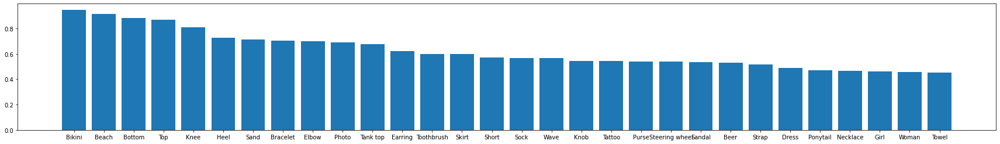

In [34]:
import collections
import matplotlib.pyplot as plt

fig = plt.figure()
fig.set_figwidth(30)
plt.bar(diff_mis.keys(), diff_mis.values())

In [35]:
 table = pd.DataFrame(difference)
 table[:30]

,tag,diff
0,Bikini,0.948387
1,Beach,0.916667
2,Bottom,0.882353
3,Top,0.868852
4,Knee,0.809524
5,Heel,0.727273
6,Sand,0.714286
7,Bracelet,0.705521
8,Elbow,0.700000
9,Photo,0.692308


In [38]:
difference.sort(key=lambda x: x["diff"], reverse=True)

In [36]:
difference = []
for i in range(0,len(perc_notmis)):
    diff = perc_notmis[i]["perc"] - perc_mis[i]["perc"]
    difference.append({"tag": perc_notmis[i]["tag"], "diff": diff})
difference

[{'tag': 'Hair', 'diff': -0.1926634768740032},
 {'tag': 'Face', 'diff': -0.0362803804156393},
 {'tag': 'Man', 'diff': 0.14600674915635548},
 {'tag': 'Nose', 'diff': -0.035915970182968104},
 {'tag': 'Eye', 'diff': -0.009319664492078328},
 {'tag': 'Poster', 'diff': -0.04651162790697677},
 {'tag': 'Hand', 'diff': -0.15514018691588788},
 {'tag': 'Mouth', 'diff': -0.0002859593937660776},
 {'tag': 'Shirt', 'diff': -0.08814240597186335},
 {'tag': 'Woman', 'diff': -0.45849056603773586},
 {'tag': 'Ear', 'diff': 0.07204610951008644},
 {'tag': 'Head', 'diff': 0.05529225908372831},
 {'tag': 'Arm', 'diff': -0.22867608581894294},
 {'tag': 'Wall', 'diff': -0.044308111792774385},
 {'tag': 'Leg', 'diff': -0.31619537275064263},
 {'tag': 'Glasses', 'diff': -0.0041152263374485964},
 {'tag': 'Person', 'diff': 0.06186726659167602},
 {'tag': 'Hat', 'diff': 0.09090909090909088},
 {'tag': 'Girl', 'diff': -0.46315789473684216},
 {'tag': 'Tree', 'diff': 0.04904632152588556},
 {'tag': 'Dress', 'diff': -0.48829953

In [39]:
table = pd.DataFrame(difference)
table[:30]

,tag,diff
0,Envelope,0.851852
1,Seal,0.777778
2,Lion,0.772727
3,Carpet,0.714286
4,Penguin,0.696552
5,Claw,0.666667
6,Scoreboard,0.666667
7,Cat,0.648352
8,Whisker,0.634615
9,Mouse,0.600000


In [69]:
from collections import Counter
diff_notmis = Counter()
for item in difference[:30]:
    diff_notmis[item["tag"]] += item["diff"]
diff_notmis.most_common()

[('Whisker', 0.6164383561643836),
 ('Beak', 0.5688622754491017),
 ('Cat', 0.5652173913043479),
 ('Envelope', 0.5632183908045978),
 ('Penguin', 0.5602094240837696),
 ('Lion', 0.5483870967741935),
 ('Snout', 0.536231884057971),
 ('Claw', 0.518987341772152),
 ('Crab', 0.4285714285714286),
 ('Wing', 0.4234234234234234),
 ('House', 0.4166666666666667),
 ('Skull', 0.41496598639455784),
 ('Nail', 0.4042553191489362),
 ('Bear', 0.40213523131672596),
 ('Paw', 0.39549839228295824),
 ('Feather', 0.39285714285714285),
 ('Tail', 0.3856209150326797),
 ('Rabbit', 0.38181818181818183),
 ('Balloon', 0.37662337662337664),
 ('Sculpture', 0.37349397590361444),
 ('Gun', 0.36744186046511623),
 ('Owl', 0.35714285714285715),
 ('Flag', 0.3548387096774193),
 ('Clock', 0.3548387096774193),
 ('Vest', 0.34848484848484845),
 ('Duck', 0.34545454545454546),
 ('Animal', 0.34293948126801155),
 ('Dog', 0.33866666666666667),
 ('Frog', 0.33834586466165417),
 ('Bird', 0.3333333333333333)]

<BarContainer object of 30 artists>

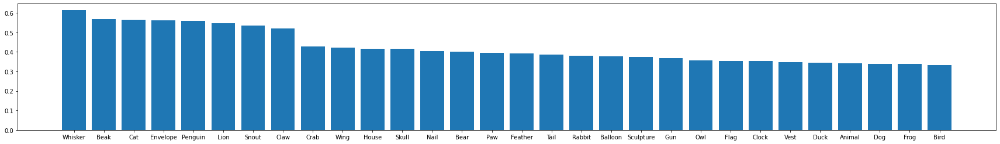

In [70]:
import collections
import matplotlib.pyplot as plt

fig = plt.figure()
fig.set_figwidth(30)
plt.bar(diff_notmis.keys(), diff_notmis.values())

### Captions

In [142]:
dataset = pd.read_csv('text_cap_dataset.csv', sep='\t')
dataset.drop(['Unnamed: 0', "Text Transcription", "file_name"], axis=1, inplace=True)
dataset

,misogynous,caption
0,0,a white pitcher and a piece of cheese on a table.
1,1,a panda bear sitting on a stump with a bottle.
2,0,a man and a woman sitting on a bed playing a v...
3,0,a man jumping in the air with a cell phone.
4,0,a picture of a house with a cat and a pumpkin.
...,...,...
9995,0,a large pig is standing in the water with a cow.
9996,0,a man and a woman sitting on a couch.
9997,0,a woman standing in a crowd of people holding ...
9998,0,a picture of a person with a smile on their face.


In [143]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
from nltk.tokenize import sent_tokenize, word_tokenize 
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import wordnet
from nltk.tag import pos_tag

[nltk_data] Downloading package punkt to /home/jimmy/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/jimmy/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/jimmy/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /home/jimmy/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [144]:
def NormalizeWithPOS(text):
    # Lemmatization & Stemming according to POS tagging

    word_list = word_tokenize(text)
    rev = []
    lemmatizer = WordNetLemmatizer() 
  
    for word, tag in pos_tag(word_list):
        if tag.startswith('J'):
            w = lemmatizer.lemmatize(word, pos='a')
        elif tag.startswith('V'):
            w = lemmatizer.lemmatize(word, pos='v')
        elif tag.startswith('N'):
            w = lemmatizer.lemmatize(word, pos='n')
        elif tag.startswith('R'):
            w = lemmatizer.lemmatize(word, pos='r')
        else:
            w = word
        #w = stemmer.stem(w)
        rev.append(w)
    review = ' '.join(rev)
    return review

In [148]:
# Data pre-processing
import string
import re
def data_pre_processing(data):
  #review = re.sub(r'[\S]+\.(net|com|org|info|edu|gov|uk|de|ca|jp|fr|au|us|ru|ch|it|nel|se|no|es|mil)[\S]*\s?','',data)
  #review = re.sub("@[^\s]+", '', data) #tag username
  review = NormalizeWithPOS(data)
  review = review.translate(str.maketrans('', '', string.punctuation))
  review = re.sub(r'\d+', '', review)
  #review = review.lower()
  review = review.split()
  review = [word for word in review if not word in stopwords]
  review = ' '.join(review)

  return review

dataset['clean']=  dataset['caption'].apply(lambda x: data_pre_processing(x))

In [147]:
stopwords = ["a", "on", "of", "in", "with", "and", "is", "the", "to", "at","an"]

In [95]:
captions = list(dataset["clean"])

In [50]:
captions[0][2]

'i'

In [32]:
for token in captions[0].split():
    print(token)


a
white
pitcher
and
a
piece
of
cheese
on
a
table.


In [96]:
token_corpus = []
for doc in captions:
    tokens = doc.split()
    for token in tokens:
        token_corpus.append(token)

In [97]:
len(token_corpus)

50639

In [53]:
token_corpus

['white',
 'pitcher',
 'piece',
 'cheese',
 'table',
 'panda',
 'bear',
 'sitting',
 'stump',
 'bottle',
 'man',
 'woman',
 'sitting',
 'bed',
 'playing',
 'video',
 'game',
 'man',
 'jumping',
 'air',
 'cell',
 'phone',
 'picture',
 'house',
 'cat',
 'pumpkin',
 'website',
 'picture',
 'couch',
 'table',
 'man',
 'wearing',
 'hoodie',
 'tie',
 'front',
 'books',
 'man',
 'laughing',
 'message',
 'screen',
 'picture',
 'headphones',
 'phone',
 'picture',
 'woman',
 'joke',
 'her',
 'face',
 'collage',
 'pictures',
 'man',
 'woman',
 'picture',
 'woman',
 'wearing',
 'black',
 'hoodie',
 'clothes',
 'yellow',
 'phone',
 'face',
 'top',
 'table',
 'large',
 'white',
 'bird',
 'shoe',
 'its',
 'back',
 'woman',
 'standing',
 'front',
 'wall',
 'phone',
 'large',
 'airplane',
 'parked',
 'next',
 'building',
 'person',
 'laying',
 'hospital',
 'bed',
 'group',
 'women',
 'standing',
 'next',
 'each',
 'other',
 'couple',
 'women',
 'bikinis',
 'standing',
 'next',
 'each',
 'other',
 'coup

In [100]:
len(cnt_tot)

1171

In [149]:
from collections import Counter
cnt_tot = Counter()

for item in token_corpus:
    cnt_tot[item] += 1

termini = cnt_tot.most_common(383)


In [150]:
termini

[('picture', 3600),
 ('woman', 3469),
 ('man', 3151),
 ('be', 1804),
 ('stand', 1796),
 ('sit', 1474),
 ('hold', 1068),
 ('front', 1019),
 ('group', 950),
 ('people', 778),
 ('next', 677),
 ('person', 665),
 ('couple', 594),
 ('her', 553),
 ('table', 539),
 ('face', 528),
 ('cat', 408),
 ('sign', 404),
 ('top', 398),
 ('other', 398),
 ('each', 390),
 ('phone', 383),
 ('wear', 371),
 ('up', 359),
 ('suit', 353),
 ('his', 344),
 ('car', 327),
 ('tie', 326),
 ('it', 322),
 ('poster', 318),
 ('white', 314),
 ('glass', 313),
 ('two', 310),
 ('lay', 283),
 ('red', 283),
 ('black', 282),
 ('collage', 281),
 ('hand', 281),
 ('cell', 276),
 ('dog', 270),
 ('room', 267),
 ('men', 262),
 ('bed', 246),
 ('smile', 246),
 ('bikini', 239),
 ('girl', 232),
 ('hat', 231),
 ('joke', 220),
 ('shirt', 217),
 ('close', 216),
 ('talk', 209),
 ('hair', 205),
 ('screen', 198),
 ('cartoon', 194),
 ('kitchen', 170),
 ('penguin', 168),
 ('chair', 163),
 ('bear', 162),
 ('green', 160),
 ('magazine', 159),
 ('game

In [153]:
cap = []
for item in termini:
    cap.append(item[0])

In [133]:
cap[0]

'picture'

In [122]:
len(termini)

300

In [58]:
i = 1
for token in dataset["clean"][i].split():
    print(token)

panda
bear
sitting
stump
bottle


In [151]:
import ast
terms_mis = []
terms_not_mis = []
terms = []
for i in range(0, len(dataset)):
    elem = []
    if dataset["misogynous"][i] == 1:
        elem_mis = []
        for token in dataset["clean"][i].split():
                elem_mis.append(token)
                elem.append(token)
        terms_mis.append(elem_mis)
        terms.append(elem)
    if dataset["misogynous"][i] == 0:
        elem_notmis=[]
        for token in dataset["clean"][i].split():
            elem_notmis.append(token)
            elem.append(token)
            
        terms_not_mis.append(elem_notmis)
        terms.append(elem)

In [104]:
print(len(terms))
print(len(terms_mis))
print(len(terms_not_mis))

10000
5000
5000


In [152]:
from collections import Counter
cnt_tot = Counter()
for item in terms:
    for token in item:
        cnt_tot[token] += 1
cnt_tot.most_common()

[('picture', 3600),
 ('woman', 3469),
 ('man', 3151),
 ('be', 1804),
 ('stand', 1796),
 ('sit', 1474),
 ('hold', 1068),
 ('front', 1019),
 ('group', 950),
 ('people', 778),
 ('next', 677),
 ('person', 665),
 ('couple', 594),
 ('her', 553),
 ('table', 539),
 ('face', 528),
 ('cat', 408),
 ('sign', 404),
 ('top', 398),
 ('other', 398),
 ('each', 390),
 ('phone', 383),
 ('wear', 371),
 ('up', 359),
 ('suit', 353),
 ('his', 344),
 ('car', 327),
 ('tie', 326),
 ('it', 322),
 ('poster', 318),
 ('white', 314),
 ('glass', 313),
 ('two', 310),
 ('lay', 283),
 ('red', 283),
 ('black', 282),
 ('collage', 281),
 ('hand', 281),
 ('cell', 276),
 ('dog', 270),
 ('room', 267),
 ('men', 262),
 ('bed', 246),
 ('smile', 246),
 ('bikini', 239),
 ('girl', 232),
 ('hat', 231),
 ('joke', 220),
 ('shirt', 217),
 ('close', 216),
 ('talk', 209),
 ('hair', 205),
 ('screen', 198),
 ('cartoon', 194),
 ('kitchen', 170),
 ('penguin', 168),
 ('chair', 163),
 ('bear', 162),
 ('green', 160),
 ('magazine', 159),
 ('game

In [106]:
from collections import Counter
cnt_mis = Counter()
for item in terms_mis:
    for token in item:
        cnt_mis[token] += 1
cnt_mis.most_common()

[('woman', 1961),
 ('picture', 1762),
 ('man', 1511),
 ('be', 923),
 ('stand', 911),
 ('sit', 754),
 ('hold', 543),
 ('front', 492),
 ('group', 480),
 ('people', 378),
 ('next', 352),
 ('her', 312),
 ('person', 304),
 ('couple', 292),
 ('face', 277),
 ('table', 276),
 ('other', 219),
 ('each', 215),
 ('top', 204),
 ('sign', 198),
 ('phone', 193),
 ('cat', 186),
 ('wear', 174),
 ('up', 174),
 ('glass', 169),
 ('suit', 168),
 ('his', 166),
 ('car', 166),
 ('poster', 161),
 ('two', 158),
 ('it', 152),
 ('room', 147),
 ('bikini', 146),
 ('white', 146),
 ('tie', 146),
 ('hand', 143),
 ('lay', 142),
 ('cell', 141),
 ('red', 139),
 ('collage', 137),
 ('black', 133),
 ('girl', 128),
 ('dog', 127),
 ('joke', 125),
 ('bed', 122),
 ('men', 121),
 ('hat', 116),
 ('talk', 108),
 ('close', 107),
 ('hair', 106),
 ('smile', 104),
 ('shirt', 100),
 ('cartoon', 91),
 ('kitchen', 85),
 ('magazine', 80),
 ('chair', 78),
 ('dress', 78),
 ('game', 77),
 ('camera', 77),
 ('green', 76),
 ('standing', 74),
 ('

In [107]:
from collections import Counter
cnt_notmis = Counter()
for item in terms_not_mis:
    for token in item:
        cnt_notmis[token] += 1
cnt_notmis.most_common()

[('picture', 1838),
 ('man', 1640),
 ('woman', 1508),
 ('stand', 885),
 ('be', 881),
 ('sit', 720),
 ('front', 527),
 ('hold', 525),
 ('group', 470),
 ('people', 400),
 ('person', 361),
 ('next', 325),
 ('couple', 302),
 ('table', 263),
 ('face', 251),
 ('her', 241),
 ('cat', 222),
 ('sign', 206),
 ('wear', 197),
 ('top', 194),
 ('phone', 190),
 ('up', 185),
 ('suit', 185),
 ('tie', 180),
 ('other', 179),
 ('his', 178),
 ('each', 175),
 ('it', 170),
 ('white', 168),
 ('car', 161),
 ('poster', 157),
 ('two', 152),
 ('black', 149),
 ('collage', 144),
 ('glass', 144),
 ('red', 144),
 ('dog', 143),
 ('smile', 142),
 ('men', 141),
 ('lay', 141),
 ('hand', 138),
 ('cell', 135),
 ('screen', 131),
 ('bed', 124),
 ('room', 120),
 ('shirt', 117),
 ('hat', 115),
 ('close', 109),
 ('girl', 104),
 ('cartoon', 103),
 ('talk', 101),
 ('penguin', 99),
 ('hair', 99),
 ('joke', 95),
 ('bear', 94),
 ('bikini', 93),
 ('food', 85),
 ('chair', 85),
 ('kitchen', 85),
 ('green', 84),
 ('game', 80),
 ('magazin

In [108]:
termini_mis = []
for item in termini:
    termini_mis.append((item[0], cnt_mis[item[0]]))

In [110]:
perc_mis = []
for i in range(0,len(object_tags)):
    #print(item[0])
    print(tags_mis[i][0])
    perc = tags_mis[i][1]/(object_tags[i][1])
    perc_mis.append({"tag": tags_mis[i][0], "perc": perc})

Stump


TypeError: unsupported operand type(s) for /: 'str' and 'int'

In [111]:
perc_mis = []
for i in range(0,len(termini)):
    #print(item[0])
    print(termini_mis[i][0])
    perc = termini_mis[i][1]/(termini[i][1])
    perc_mis.append({"tag": termini_mis[i][0], "perc": perc})

picture
woman
man
be
stand
sit
hold
front
group
people
next
person
couple
her
table
face
cat
sign
top
other
each
phone
wear
up
suit
his
car
tie
it
poster
white
glass
two
lay
red
black
collage
hand
cell
dog
room
men
bed
smile
bikini
girl
hat
joke
shirt
close
talk
hair
screen
cartoon
kitchen
penguin
chair
bear
green
magazine
game
food
dress
street
camera
couch
different
standing
water
blue
photo
book
cover
bunch
floor
mouth
wall
beard
head
microphone
yellow
computer
its
play
tree
bottle
laugh
beach
video
back
boy
character
their
gun
three
ground
costume
pink
for
movie
long
look
building
young
down
background
mask
animal
large
jacket
eat
laptop
toy
field
air
tank
crowd
around
house
bird
walk
pose
type
piece
baby
beer
flag
painting
pair
sunglass
rock
brush
message
grass
plate
bathroom
side
window
wine
child
quote
uniform
open
cup
paper
stuffed
monkey
toilet
television
box
store
knife
lion
bench
statue
park
drink
door
teeth
frog
dinosaur
pole
mirror
cake
horse
arm
brown
while
into
bald
truc

In [112]:
termini_notmis = []
for item in termini:
    termini_notmis.append((item[0], cnt_notmis[item[0]]))

In [113]:
perc_notmis = []
for i in range(0,len(termini)):
    #print(item[0])
    print(termini_notmis[i][0])
    perc = termini_notmis[i][1]/(termini[i][1])
    perc_notmis.append({"tag": termini_notmis[i][0], "perc": perc})

picture
woman
man
be
stand
sit
hold
front
group
people
next
person
couple
her
table
face
cat
sign
top
other
each
phone
wear
up
suit
his
car
tie
it
poster
white
glass
two
lay
red
black
collage
hand
cell
dog
room
men
bed
smile
bikini
girl
hat
joke
shirt
close
talk
hair
screen
cartoon
kitchen
penguin
chair
bear
green
magazine
game
food
dress
street
camera
couch
different
standing
water
blue
photo
book
cover
bunch
floor
mouth
wall
beard
head
microphone
yellow
computer
its
play
tree
bottle
laugh
beach
video
back
boy
character
their
gun
three
ground
costume
pink
for
movie
long
look
building
young
down
background
mask
animal
large
jacket
eat
laptop
toy
field
air
tank
crowd
around
house
bird
walk
pose
type
piece
baby
beer
flag
painting
pair
sunglass
rock
brush
message
grass
plate
bathroom
side
window
wine
child
quote
uniform
open
cup
paper
stuffed
monkey
toilet
television
box
store
knife
lion
bench
statue
park
drink
door
teeth
frog
dinosaur
pole
mirror
cake
horse
arm
brown
while
into
bald
truc

In [114]:
perc_notmis

[{'tag': 'picture', 'perc': 0.5105555555555555},
 {'tag': 'woman', 'perc': 0.43470740847506484},
 {'tag': 'man', 'perc': 0.5204696921612186},
 {'tag': 'be', 'perc': 0.4883592017738359},
 {'tag': 'stand', 'perc': 0.4927616926503341},
 {'tag': 'sit', 'perc': 0.48846675712347354},
 {'tag': 'hold', 'perc': 0.49157303370786515},
 {'tag': 'front', 'perc': 0.5171736997055937},
 {'tag': 'group', 'perc': 0.49473684210526314},
 {'tag': 'people', 'perc': 0.5141388174807198},
 {'tag': 'next', 'perc': 0.48005908419497784},
 {'tag': 'person', 'perc': 0.5428571428571428},
 {'tag': 'couple', 'perc': 0.5084175084175084},
 {'tag': 'her', 'perc': 0.4358047016274864},
 {'tag': 'table', 'perc': 0.48794063079777367},
 {'tag': 'face', 'perc': 0.4753787878787879},
 {'tag': 'cat', 'perc': 0.5441176470588235},
 {'tag': 'sign', 'perc': 0.5099009900990099},
 {'tag': 'top', 'perc': 0.48743718592964824},
 {'tag': 'other', 'perc': 0.44974874371859297},
 {'tag': 'each', 'perc': 0.44871794871794873},
 {'tag': 'phone',

In [115]:
difference = []
for i in range(0,len(perc_mis)):
    diff = perc_mis[i]["perc"] - perc_notmis[i]["perc"]
    difference.append({"tag": perc_mis[i]["tag"], "diff": diff})
difference

[{'tag': 'picture', 'diff': -0.02111111111111108},
 {'tag': 'woman', 'diff': 0.13058518304987032},
 {'tag': 'man', 'diff': -0.04093938432243727},
 {'tag': 'be', 'diff': 0.023281596452328135},
 {'tag': 'stand', 'diff': 0.014476614699331813},
 {'tag': 'sit', 'diff': 0.023066485753052923},
 {'tag': 'hold', 'diff': 0.01685393258426965},
 {'tag': 'front', 'diff': -0.03434739941118742},
 {'tag': 'group', 'diff': 0.010526315789473717},
 {'tag': 'people', 'diff': -0.028277634961439535},
 {'tag': 'next', 'diff': 0.03988183161004427},
 {'tag': 'person', 'diff': -0.08571428571428569},
 {'tag': 'couple', 'diff': -0.01683501683501687},
 {'tag': 'her', 'diff': 0.12839059674502717},
 {'tag': 'table', 'diff': 0.024118738404452722},
 {'tag': 'face', 'diff': 0.049242424242424254},
 {'tag': 'cat', 'diff': -0.08823529411764702},
 {'tag': 'sign', 'diff': -0.01980198019801982},
 {'tag': 'top', 'diff': 0.025125628140703515},
 {'tag': 'other', 'diff': 0.10050251256281406},
 {'tag': 'each', 'diff': 0.102564102

In [116]:
from collections import Counter
diff_mis = Counter()
for item in difference[:30]:
    diff_mis[item["tag"]] += item["diff"]
diff_mis.most_common()

[('woman', 0.13058518304987032),
 ('her', 0.12839059674502717),
 ('each', 0.10256410256410259),
 ('other', 0.10050251256281406),
 ('face', 0.049242424242424254),
 ('next', 0.03988183161004427),
 ('top', 0.025125628140703515),
 ('table', 0.024118738404452722),
 ('be', 0.023281596452328135),
 ('sit', 0.023066485753052923),
 ('hold', 0.01685393258426965),
 ('car', 0.015290519877675823),
 ('stand', 0.014476614699331813),
 ('poster', 0.012578616352201255),
 ('group', 0.010526315789473717),
 ('phone', 0.007832898172323743),
 ('couple', -0.01683501683501687),
 ('sign', -0.01980198019801982),
 ('picture', -0.02111111111111108),
 ('people', -0.028277634961439535),
 ('up', -0.03064066852367686),
 ('front', -0.03434739941118742),
 ('his', -0.034883720930232565),
 ('man', -0.04093938432243727),
 ('suit', -0.04815864022662891),
 ('it', -0.05590062111801242),
 ('wear', -0.06199460916442051),
 ('person', -0.08571428571428569),
 ('cat', -0.08823529411764702),
 ('tie', -0.10429447852760737)]

<BarContainer object of 30 artists>

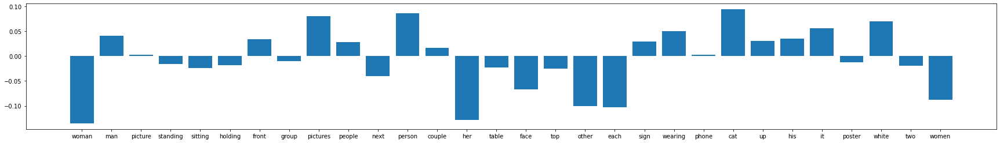

In [117]:

import matplotlib.pyplot as plt

fig = plt.figure()
fig.set_figwidth(30)
plt.bar(diff_notmis.keys(), diff_notmis.values())

In [118]:
difference.sort(key=lambda x: x["diff"], reverse=True)
table = pd.DataFrame(difference)
table[:30]

,tag,diff
0,pile,0.500000
1,blanket,0.444444
2,apple,0.428571
3,hug,0.405405
4,bat,0.400000
5,bar,0.375000
6,smoke,0.375000
7,ocean,0.363636
8,another,0.350000
9,wine,0.333333


In [119]:
difference = []
for i in range(0,len(perc_notmis)):
    diff = perc_notmis[i]["perc"] - perc_mis[i]["perc"]
    difference.append({"tag": perc_notmis[i]["tag"], "diff": diff})
difference.sort(key=lambda x: x["diff"], reverse=True)
difference

[{'tag': 'shot', 'diff': 0.6363636363636365},
 {'tag': 'board', 'diff': 0.6000000000000001},
 {'tag': 'snow', 'diff': 0.4545454545454546},
 {'tag': 'eye', 'diff': 0.4545454545454546},
 {'tag': 'comic', 'diff': 0.375},
 {'tag': 'elephant', 'diff': 0.37142857142857144},
 {'tag': 'duck', 'diff': 0.368421052631579},
 {'tag': 'brick', 'diff': 0.368421052631579},
 {'tag': 'cut', 'diff': 0.3333333333333333},
 {'tag': 'sandwich', 'diff': 0.3333333333333333},
 {'tag': 'seal', 'diff': 0.3333333333333333},
 {'tag': 'rid', 'diff': 0.3333333333333333},
 {'tag': 'stove', 'diff': 0.3333333333333333},
 {'tag': 'screen', 'diff': 0.32323232323232326},
 {'tag': 'read', 'diff': 0.31034482758620685},
 {'tag': 'helmet', 'diff': 0.27777777777777773},
 {'tag': 'old', 'diff': 0.2631578947368421},
 {'tag': 'them', 'diff': 0.2631578947368421},
 {'tag': 'toy', 'diff': 0.2564102564102564},
 {'tag': 'painting', 'diff': 0.24637681159420288},
 {'tag': 'lion', 'diff': 0.24528301886792447},
 {'tag': 'coffee', 'diff': 0

In [120]:
from collections import Counter
diff_notmis = Counter()
for item in difference[:30]:
    diff_notmis[item["tag"]] += item["diff"]
diff_notmis.most_common()

[('shot', 0.6363636363636365),
 ('board', 0.6000000000000001),
 ('snow', 0.4545454545454546),
 ('eye', 0.4545454545454546),
 ('comic', 0.375),
 ('elephant', 0.37142857142857144),
 ('duck', 0.368421052631579),
 ('brick', 0.368421052631579),
 ('cut', 0.3333333333333333),
 ('sandwich', 0.3333333333333333),
 ('seal', 0.3333333333333333),
 ('rid', 0.3333333333333333),
 ('stove', 0.3333333333333333),
 ('screen', 0.32323232323232326),
 ('read', 0.31034482758620685),
 ('helmet', 0.27777777777777773),
 ('old', 0.2631578947368421),
 ('them', 0.2631578947368421),
 ('toy', 0.2564102564102564),
 ('painting', 0.24637681159420288),
 ('lion', 0.24528301886792447),
 ('coffee', 0.24137931034482762),
 ('horse', 0.23809523809523814),
 ('pot', 0.22222222222222227),
 ('motorcycle', 0.22222222222222227),
 ('pillow', 0.2173913043478261),
 ('statue', 0.21568627450980388),
 ('towel', 0.21428571428571425),
 ('piece', 0.19999999999999996),
 ('door', 0.19999999999999996)]

In [121]:
table = pd.DataFrame(difference)
table[:30]

,tag,diff
0,shot,0.636364
1,board,0.600000
2,snow,0.454545
3,eye,0.454545
4,comic,0.375000
5,elephant,0.371429
6,duck,0.368421
7,brick,0.368421
8,cut,0.333333
9,sandwich,0.333333


In [135]:
dataset["clean"][0]

'white pitcher piece cheese table'

In [139]:
cnt_tot.most_common(1100)

[('picture', 3600),
 ('woman', 3469),
 ('man', 3151),
 ('be', 1804),
 ('stand', 1796),
 ('sit', 1474),
 ('hold', 1068),
 ('front', 1019),
 ('group', 950),
 ('people', 778),
 ('next', 677),
 ('person', 665),
 ('couple', 594),
 ('her', 553),
 ('table', 539),
 ('face', 528),
 ('cat', 408),
 ('sign', 404),
 ('top', 398),
 ('other', 398),
 ('each', 390),
 ('phone', 383),
 ('wear', 371),
 ('up', 359),
 ('suit', 353),
 ('his', 344),
 ('car', 327),
 ('tie', 326),
 ('it', 322),
 ('poster', 318),
 ('white', 314),
 ('glass', 313),
 ('two', 310),
 ('lay', 283),
 ('red', 283),
 ('black', 282),
 ('collage', 281),
 ('hand', 281),
 ('cell', 276),
 ('dog', 270),
 ('room', 267),
 ('men', 262),
 ('bed', 246),
 ('smile', 246),
 ('bikini', 239),
 ('girl', 232),
 ('hat', 231),
 ('joke', 220),
 ('shirt', 217),
 ('close', 216),
 ('talk', 209),
 ('hair', 205),
 ('screen', 198),
 ('cartoon', 194),
 ('kitchen', 170),
 ('penguin', 168),
 ('chair', 163),
 ('bear', 162),
 ('green', 160),
 ('magazine', 159),
 ('game

In [141]:
cnt_tot["caption"]

10

In [154]:
dataset.drop(['caption'], axis=1, inplace=True)


In [155]:
count = 0
for term in cap:
    print(count)
    tmp = []
    #print("term unico: ", term)
    for i in range(0, len(dataset)):
        img_terms = []
        lista_terms_row= dataset["clean"][i].split()
        #print("lista tags riga ", i, " : ", lista_terms_row)
        for item in lista_terms_row:
            if term == item:
                img_terms.append(1)   ###per non binario appendi item["conf"]
                break
            else: 
                img_terms.append(0)
        
        max_conf = max(img_terms)
        #print("max conf ", max_conf)    
        tmp.append(max_conf)
    dataset[term] = tmp
    count += 1
    
dataset        

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

,misogynous,clean,picture,woman,man,be,stand,sit,hold,front,...,track,spoon,caption,squirrel,page,lean,candle,four,cow,foot
0,0,white pitcher piece cheese table,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,panda bear sit stump bottle,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,man woman sit bed play video game,0,1,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,man jumping air cell phone,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,picture house cat pumpkin,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0,large pig be stand water cow,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9996,0,man woman sit couch,0,1,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9997,0,woman stand crowd people hold wine glass,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9998,0,picture person smile their face,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [140]:
dataset["caption"].value_counts()

0    9990
1      10
Name: caption, dtype: int64

In [156]:
dataset.to_csv("captions_binary.csv", sep ="\t")

In [157]:
col=['class']
col.extend(dataset.columns[2:].tolist())
print(col)

['class', 'picture', 'woman', 'man', 'be', 'stand', 'sit', 'hold', 'front', 'group', 'people', 'next', 'person', 'couple', 'her', 'table', 'face', 'cat', 'sign', 'top', 'other', 'each', 'phone', 'wear', 'up', 'suit', 'his', 'car', 'tie', 'it', 'poster', 'white', 'glass', 'two', 'lay', 'red', 'black', 'collage', 'hand', 'cell', 'dog', 'room', 'men', 'bed', 'smile', 'bikini', 'girl', 'hat', 'joke', 'shirt', 'close', 'talk', 'hair', 'screen', 'cartoon', 'kitchen', 'penguin', 'chair', 'bear', 'green', 'magazine', 'game', 'food', 'dress', 'street', 'camera', 'couch', 'different', 'standing', 'water', 'blue', 'photo', 'book', 'cover', 'bunch', 'floor', 'mouth', 'wall', 'beard', 'head', 'microphone', 'yellow', 'computer', 'its', 'play', 'tree', 'bottle', 'laugh', 'beach', 'video', 'back', 'boy', 'character', 'their', 'gun', 'three', 'ground', 'costume', 'pink', 'for', 'movie', 'long', 'look', 'building', 'young', 'down', 'background', 'mask', 'animal', 'large', 'jacket', 'eat', 'laptop', 'toy

In [158]:
condizionate = pd.DataFrame(columns=col)
condizionate.loc[0,'class']='misogynous'
for x in dataset.columns[2:]:
  if len(dataset.loc[dataset['misogynous']==1,x].value_counts())==2:
    #if dataset.loc[dataset['miso']==1,x].value_counts()[1]/dataset.loc[dataset['miso']==1,x].shape[0] !=1:
      condizionate.loc[0,x]=dataset.loc[dataset['misogynous']==1,x].value_counts()[1]/dataset.loc[dataset['misogynous']==1,x].shape[0]
  elif 1 in dataset.loc[dataset['misogynous']==1,x].tolist():
    condizionate.loc[0,x]=1-(1/5000)
  else:
    condizionate.loc[0,x]=(1/5000)

In [159]:
condizionate.loc[1,'class']='not_misogynous'
for x in dataset.columns[2:]:

  if len(dataset.loc[dataset['misogynous']==0,x].value_counts())==2:
      condizionate.loc[1,x]=dataset.loc[dataset['misogynous']==0,x].value_counts()[1]/dataset.loc[dataset['misogynous']==0,x].shape[0]
  elif 1 in dataset.loc[dataset['misogynous']==0,x].tolist():
      condizionate.loc[1,x]=1-0.0002
  else:
    condizionate.loc[1,x]=0.0002

In [160]:
condizionate.head()

,class,picture,woman,man,be,stand,sit,hold,front,group,...,track,spoon,caption,squirrel,page,lean,candle,four,cow,foot
0,misogynous,0.346,0.3896,0.2986,0.184,0.1822,0.1504,0.1084,0.098,0.096,...,0.0014,0.0012,0.001,0.0008,0.001,0.0014,0.0012,0.0014,0.0006,0.0012
1,not_misogynous,0.3638,0.3006,0.3238,0.1758,0.177,0.1438,0.105,0.1052,0.094,...,0.0004,0.0008,0.001,0.0012,0.001,0.0006,0.0008,0.0006,0.0014,0.0008


In [161]:
calcolate = pd.DataFrame(columns= ['meme','eq', 'valore'])
calcolate.head()

,meme,eq,valore


In [163]:
for index, row in dataset.iterrows():
  print('\n')
  print(index)

  tags = []
  eq = 'P(M|'
  for i in range(2,len(dataset.columns)):
    if row[i]==1:
      tags.append(dataset.columns[i])
      eq = eq + dataset.columns[i] + ' '
  eq = eq + ')'
  print(eq)

  #calcolo il valore della probabilità NB: VALORI da NORMALIZZARE
  value_pos = 0.5
  value_neg = 0.5
  conto = '0.5'

  for x in tags:
    conto = conto + '*'+ str(condizionate.loc[0, x])
    value_pos = value_pos * condizionate.loc[0, x]
    value_neg = value_neg * condizionate.loc[1, x]

  print(conto)

  #Normalizzo
  somma = value_pos + value_neg
  value_pos = value_pos / somma
  value_neg = value_neg / somma

  #print(conto)
  calcolate=calcolate.append(pd.DataFrame({'meme': [index+1], 'eq': [eq], 'valore': [value_pos]}))
  print(value_pos)
  result = value_pos

  #NON MISO
  eq = 'P(¬M|'
  for i in tags:
    eq = eq + i + ' '
  eq = eq + ')'
  print(eq)
  print(value_neg)



0
P(M|table white piece )
0.5*0.0542*0.0278*0.0056
0.3669368193418925
P(¬M|table white piece )
0.6330631806581076


1
P(M|sit bear bottle )
0.5*0.1504*0.0134*0.0138
0.5777365199365444
P(¬M|sit bear bottle )
0.4222634800634555


2
P(M|woman man sit bed game play video )
0.5*0.3896*0.2986*0.1504*0.0244*0.0152*0.011*0.0116
0.6024192448828819
P(¬M|woman man sit bed game play video )
0.39758075511711805


3
P(M|man phone cell air )
0.5*0.2986*0.0386*0.0282*0.008
0.5278863976874348
P(¬M|man phone cell air )
0.4721136023125652


4
P(M|picture cat house )
0.5*0.346*0.0368*0.006
0.3516374101906212
P(¬M|picture cat house )
0.6483625898093788


5
P(M|picture table couch )
0.5*0.346*0.0542*0.0134
0.4589468065689644
P(¬M|picture table couch )
0.5410531934310355


6
P(M|man front wear tie book hoodie )
0.5*0.2986*0.098*0.0346*0.0292*0.012*0.0012
0.3052199814066545
P(¬M|man front wear tie book hoodie )
0.6947800185933455


7
P(M|man be screen laugh message )
0.5*0.2986*0.184*0.0134*0.0122*0.007
0.4

In [164]:
rimozioneTag = pd.DataFrame(columns= ['meme', 'tagTolto', 'eq', 'valore'])
rimozioneTag.head()

,meme,tagTolto,eq,valore


In [165]:
for index, row in dataset.iterrows():
  print('\n')
  print(index)

  #racolgo i tag del meme
  tags = []

  for i in range(2,len(dataset.columns)):
    if row[i]==1:
      tags.append(dataset.columns[i])

  #calcolo i valori senza il tag

  for tag in tags:
    tmp = tags.copy()
    tmp.remove(tag)
    eq = 'P(M|'

    value_pos = 0.5
    value_neg = 0.5
    conto = '0.5'

    #calcolo il valore della probabilità NB: VALORI da NORMALIZZARE
    for x in tmp:
      eq = eq + x + ' '
      conto = conto + '*'+ str(condizionate.loc[0, x])
      value_pos = value_pos * condizionate.loc[0, x]
      value_neg = value_neg * condizionate.loc[1, x]

    eq = eq + ')'
    print(eq)
    print(conto)

    #Normalizzo
    somma = value_pos + value_neg
    value_pos = value_pos / somma
    value_neg = value_neg / somma
    print(value_pos)

    #salvo
    rimozioneTag=rimozioneTag.append(pd.DataFrame({'meme': [index+1], 'tagTolto': tag,  'eq': [eq], 'valore': [value_pos]}))



0
P(M|white piece )
0.5*0.0278*0.0056
0.35824742268041243
P(M|table piece )
0.5*0.0542*0.0056
0.4090566037735849
P(M|table white )
0.5*0.0542*0.0278
0.46507809124019994


1
P(M|bear bottle )
0.5*0.0134*0.0138
0.5667524825303422
P(M|sit bottle )
0.5*0.1504*0.0138
0.6550688044438834
P(M|sit bear )
0.5*0.1504*0.0134
0.4297106208049399


2
P(M|man sit bed game play video )
0.5*0.2986*0.1504*0.0244*0.0152*0.011*0.0116
0.5389746375586344
P(M|woman sit bed game play video )
0.5*0.3896*0.1504*0.0244*0.0152*0.011*0.0116
0.62165450830032
P(M|woman man bed game play video )
0.5*0.3896*0.2986*0.0244*0.0152*0.011*0.0116
0.5916234217080929
P(M|woman man sit game play video )
0.5*0.3896*0.2986*0.1504*0.0152*0.011*0.0116
0.6063072463804451
P(M|woman man sit bed play video )
0.5*0.3896*0.2986*0.1504*0.0244*0.011*0.0116
0.6116539990144736
P(M|woman man sit bed game video )
0.5*0.3896*0.2986*0.1504*0.0244*0.0152*0.0116
0.5935147154957157
P(M|woman man sit bed game play )
0.5*0.3896*0.2986*0.1504*0.0244

In [166]:
rimozioneTag=rimozioneTag.reset_index(drop=True)

In [167]:
#valMeme-value
rimozioneTag['score'] = 0
for index, row in rimozioneTag.iterrows():
  print(index)
  print(calcolate.loc[calcolate['meme']==row[0], 'valore'].values[0] )
  print(row[3])
  print(calcolate.loc[calcolate['meme']==row[0], 'valore'].values[0] - row[3])
  print('\n')
  rimozioneTag.loc[index, 'score']= calcolate.loc[calcolate['meme']==row[0], 'valore'].values[0] - row[3]

0
0.3669368193418925
0.35824742268041243
0.008689396661480053


1
0.3669368193418925
0.4090566037735849
-0.0421197844316924


2
0.3669368193418925
0.46507809124019994
-0.09814127189830746


3
0.5777365199365444
0.5667524825303422
0.01098403740620224


4
0.5777365199365444
0.6550688044438834
-0.07733228450733898


5
0.5777365199365444
0.4297106208049399
0.14802589913160452


6
0.6024192448828819
0.5389746375586344
0.0634446073242475


7
0.6024192448828819
0.62165450830032
-0.019235263417438087


8
0.6024192448828819
0.5916234217080929
0.010795823174788999


9
0.6024192448828819
0.6063072463804451
-0.003888001497563187


10
0.6024192448828819
0.6116539990144736
-0.009234754131591694


11
0.6024192448828819
0.5935147154957157
0.008904529387166238


12
0.6024192448828819
0.5511356257190797
0.0512836191638022


13
0.5278863976874348
0.548022172212237
-0.020135774524802197


14
0.5278863976874348
0.5239804247526259
0.0039059729348089878


15
0.5278863976874348
0.5170374896096457
0.0108489080

In [168]:
rimozioneTag

,meme,tagTolto,eq,valore,score
0,1,table,P(M|white piece ),0.358247,0.008689
1,1,white,P(M|table piece ),0.409057,-0.042120
2,1,piece,P(M|table white ),0.465078,-0.098141
3,2,sit,P(M|bear bottle ),0.566752,0.010984
4,2,bear,P(M|sit bottle ),0.655069,-0.077332
...,...,...,...,...,...
47844,10000,picture,P(M|woman glass red hair ),0.604079,-0.012058
47845,10000,woman,P(M|picture glass red hair ),0.528216,0.063804
47846,10000,glass,P(M|picture woman red hair ),0.558556,0.033465
47847,10000,red,P(M|picture woman glass hair ),0.602332,-0.010311


In [169]:
result = []
for tag in dataset.columns[2:]:
  print(tag)
  print(rimozioneTag.loc[rimozioneTag['tagTolto']==tag,'score'].tolist())
  media = sum(rimozioneTag.loc[rimozioneTag['tagTolto']==tag,'score'].tolist())/len(rimozioneTag.loc[rimozioneTag['tagTolto']==tag,'score'].tolist())
  result.append({"tag": tag, "score": media})
  print(media)

picture
[-0.011520484546220844, -0.012479910294595276, -0.012511612933361227, -0.010404001028201937, -0.012507257738969102, -0.012453058070515555, -0.009356880358344033, -0.01232029320009087, -0.012533875061657151, -0.012124031017268277, -0.011749008501072966, -0.011247109201670935, -0.012088362190909141, -0.011440631846070914, -0.012438154866456608, -0.012467395718081642, -0.012021544903287107, -0.010404001028201937, -0.01227089931222558, -0.010574614284201811, -0.011757165807855186, -0.012160324999779204, -0.012241041315555479, -0.011120093839806389, -0.012445973254970544, -0.012344322481539494, -0.012438117618400857, -0.012142167659946357, -0.01208570242348872, -0.012138658464924457, -0.011152805427958268, -0.011817629448830025, -0.012508115698090183, -0.012102699849946497, -0.012221363954570963, -0.011960244397950737, -0.012539675813677154, -0.012493497402199072, -0.0117693382859273, -0.011688108138418696, -0.011842358871251069, -0.012106779322614447, -0.012190024731175919, -0.0116

In [170]:
result.sort(key=lambda x: x["score"], reverse=True)
table = pd.DataFrame(result)
table[:30]

,tag,score
0,laying,0.306152
1,tongue,0.286920
2,track,0.278232
3,pile,0.248526
4,dance,0.241537
5,heel,0.207828
6,apple,0.207284
7,racket,0.202375
8,someone,0.195404
9,four,0.193390


In [171]:
result.sort(key=lambda x: x["score"], reverse=False)
table = pd.DataFrame(result)
table[:30]

,tag,score
0,mountain,-0.267001
1,cart,-0.253112
2,shot,-0.247557
3,robe,-0.245457
4,board,-0.245250
5,hang,-0.232159
6,through,-0.223221
7,snow,-0.218396
8,eye,-0.205519
9,cow,-0.197690
